# Import Libraries

In [1]:
import zipfile, os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline


from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras import optimizers, applications
from tensorflow.keras.layers import Dense, Dropout, GlobalMaxPooling2D, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import Callback

import warnings
warnings.filterwarnings("ignore")

2026-06-29 08:16:10.196625: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1782720970.224283    1216 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1782720970.232335    1216 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1782720970.252077    1216 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782720970.252098    1216 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782720970.252101    1216 computation_placer.cc:177] computation placer alr

# Load Dataset

In [2]:
df = pd.read_csv('/kaggle/input/datasets/gpiosenka/butterfly-images40-species/butterflies and moths.csv')

In [3]:
df_train = df[df['data set'] == 'train']
df_test = df[df['data set'] == 'test']
df_val = df[df['data set'] == 'valid']

In [4]:
df_count_train = df_train['class id'].value_counts().reset_index()
df_count_test = df_test['class id'].value_counts().reset_index()
df_count_val = df_val['class id'].value_counts().reset_index()

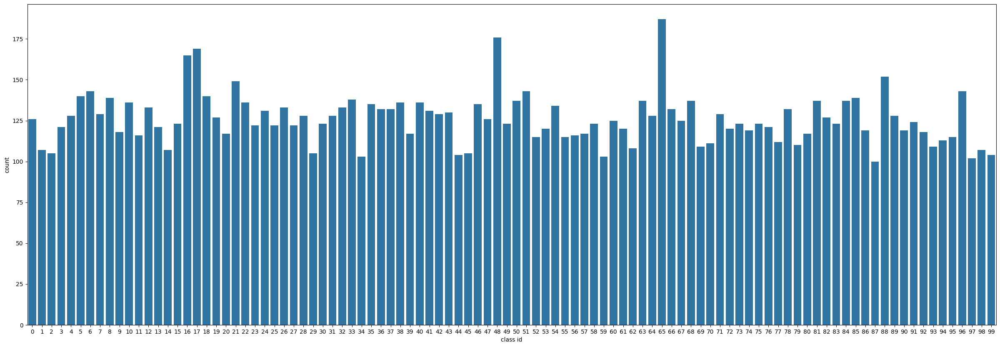

In [5]:
plt.figure(figsize=(30,10))
sns.barplot(data=df_count_train, x='class id', y='count')
plt.show()

In [6]:
ADONIS_dir = os.path.join('/kaggle/input/datasets/gpiosenka/butterfly-images40-species/train/ADONIS')
AFRICAN_GIANT_SWALLOWTAIL_dir = os.path.join('/kaggle/input/datasets/gpiosenka/butterfly-images40-species/train/AFRICAN GIANT SWALLOWTAIL')
AMERICAN_SNOOT_dir = os.path.join('/kaggle/input/datasets/gpiosenka/butterfly-images40-species/train/AMERICAN SNOOT')
AN_88_dir = os.path.join('/kaggle/input/datasets/gpiosenka/butterfly-images40-species/train/AN 88')

In [7]:
ADONIS_files = os.listdir(ADONIS_dir)
AFRICAN_GIANT_SWALLOWTAIL_files = os.listdir(AFRICAN_GIANT_SWALLOWTAIL_dir)
AMERICAN_SNOOT_files = os.listdir(AMERICAN_SNOOT_dir)
AN_88_files = os.listdir(AN_88_dir)

In [8]:
print('Total ADONIS images :', len(ADONIS_files))
print('Total AFRICAN GIANT SWALLOWTAIL images :', len(AFRICAN_GIANT_SWALLOWTAIL_files))
print('Total AMERICAN SNOOT images :', len(AMERICAN_SNOOT_files))
print('Total AN 88 images :', len(AN_88_files))

Total ADONIS images : 126
Total AFRICAN GIANT SWALLOWTAIL images : 107
Total AMERICAN SNOOT images : 105
Total AN 88 images : 121


In [9]:
nrows = 5
ncols = 5

# Index for iterating over images
pic_index = 0

In [10]:
# Set up matplotlib fig

pic_index += 5

next_ADONIS_pix = [os.path.join(ADONIS_dir, fname)
                for fname in ADONIS_files[pic_index-5:pic_index]]
next_AFRICAN_GIANT_SWALLOWTAIL_pix = [os.path.join(AFRICAN_GIANT_SWALLOWTAIL_dir, fname)
                for fname in AFRICAN_GIANT_SWALLOWTAIL_files[pic_index-5:pic_index]]
next_AMERICAN_SNOOT_pix = [os.path.join(AMERICAN_SNOOT_dir, fname)
                for fname in AMERICAN_SNOOT_files[pic_index-5:pic_index]]
next_AN_88_pix = [os.path.join(AN_88_dir, fname)
                for fname in AN_88_files[pic_index-5:pic_index]]

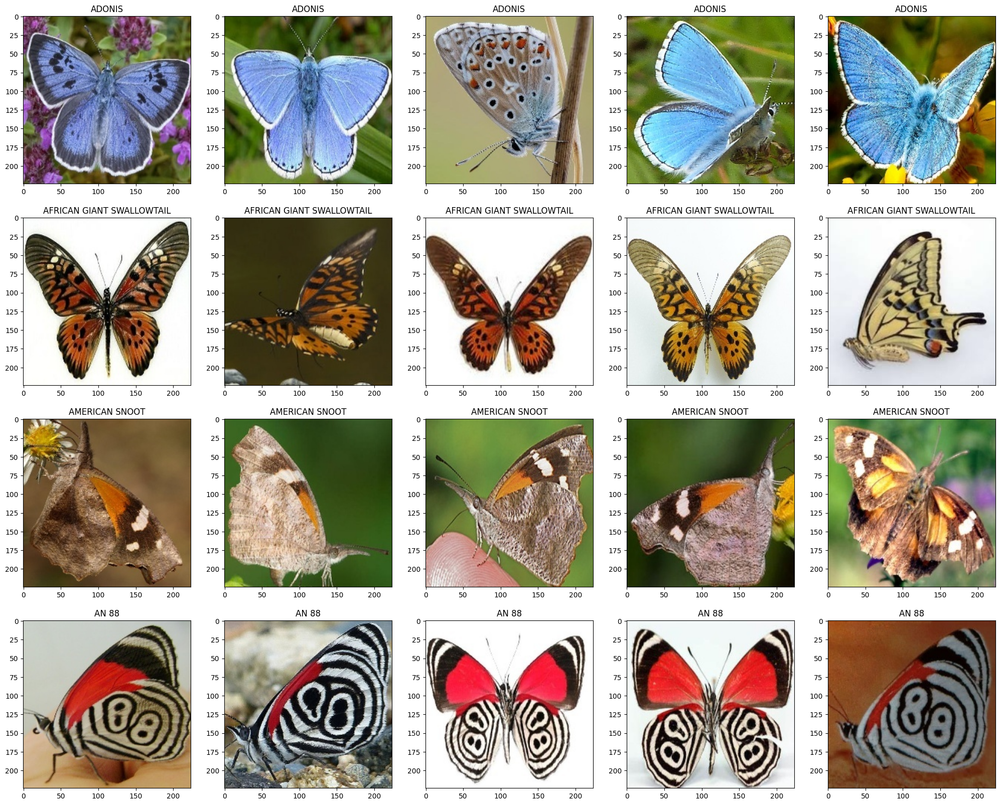

In [11]:
fig, axes = plt.subplots(4,5, figsize=(25,20))
row = 0
col1 = 0
col2 = 0
col3 = 0
col4 = 0
for i, img_path in enumerate(next_ADONIS_pix+next_AFRICAN_GIANT_SWALLOWTAIL_pix+next_AMERICAN_SNOOT_pix+next_AN_88_pix):
    if i < 5:
        img = mpimg.imread(img_path)
        axes[row][col1].imshow(img)
        axes[row][col1].set_title('ADONIS')
        col1+=1
    elif i < 10 and i >= 5:
        row=1
        img = mpimg.imread(img_path)
        axes[row][col2].imshow(img)
        axes[row][col2].set_title('AFRICAN GIANT SWALLOWTAIL')
        col2+=1
    elif i < 15 and i >= 10:
        row=2
        img = mpimg.imread(img_path)
        axes[row][col3].imshow(img)
        axes[row][col3].set_title('AMERICAN SNOOT')
        col3+=1
    elif i < 20 and i >= 15:
        row=3
        img = mpimg.imread(img_path)
        axes[row][col4].imshow(img)
        axes[row][col4].set_title('AN 88')
        col4+=1

# Data Agumentation

In [12]:
datagen = ImageDataGenerator(
    rescale=1./255,
)

In [13]:
train_dir = '/kaggle/input/datasets/gpiosenka/butterfly-images40-species/train'
test_dir = '/kaggle/input/datasets/gpiosenka/butterfly-images40-species/test'
val_dir = '/kaggle/input/datasets/gpiosenka/butterfly-images40-species/valid'

# Train Test Split

In [14]:
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    class_mode='categorical',
)

val_generator = datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    class_mode='categorical',
)

test_generator = datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    class_mode='categorical',
    shuffle=False
)


Found 12594 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 500 images belonging to 100 classes.


# EfficientNetB3 (Training)

In [15]:
base_model = applications.EfficientNetB3(
    weights='imagenet',  # Pretrained weights yang sudah dilatih dari ImageNet
    include_top=False,   # Tidak menyertakan lapisan fully connected terakhir
    input_shape=(150, 150, 3)  # Ukuran input gambar
)
base_model.trainable = True

I0000 00:00:1782720982.353018    1216 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1782720982.358418    1216 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [16]:
model = Sequential([
    base_model,
    GlobalMaxPooling2D(),  # Lapisan untuk meratakan output feature maps
    Dropout(0.5),
    Dense(512, activation='relu'),  # Fully connected layer
    Dense(100, activation='softmax')  # Output layer untuk binary classification
])

In [17]:
class MyCallback(Callback):
  def on_epoch_end(self, epoch, logs={}):
      if(logs.get('accuracy') > 0.95 and logs.get('val_accuracy') > 0.95):
          print("\nReached 95% accuracy so cancelling training!")
          self.model.stop_training = True

callbacks = MyCallback()

In [18]:
adam = optimizers.Adam(learning_rate=0.0001)

model.compile(metrics=['accuracy'], loss='categorical_crossentropy', optimizer=adam)

history= model.fit(train_generator, epochs=10, callbacks = ([callbacks]), validation_data=val_generator, shuffle=True)

Epoch 1/10


I0000 00:00:1782721040.261048    1303 service.cc:152] XLA service 0x799cbc005890 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1782721040.261086    1303 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1782721040.261091    1303 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1782721049.921202    1303 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-06-29 08:17:42.445607: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:17:42.582669: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:17:42.914627: E external/local_xl

 13/394 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - accuracy: 0.0068 - loss: 9.3199

2026-06-29 08:18:52.113858: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:18:52.249274: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:18:52.582738: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:18:52.729818: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:18:53.575719: E external/local_xla/xla/stream_

394/394 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - accuracy: 0.0552 - loss: 5.6293

2026-06-29 08:20:47.515689: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:20:47.650375: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:20:47.969274: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:20:48.120826: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-29 08:20:48.268334: E external/local_xla/xla/stream_

394/394 ━━━━━━━━━━━━━━━━━━━━ 269s 367ms/step - accuracy: 0.1487 - loss: 4.3081 - val_accuracy: 0.1580 - val_loss: 3.7205
Epoch 2/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 56s 141ms/step - accuracy: 0.6588 - loss: 1.3318 - val_accuracy: 0.8120 - val_loss: 0.7135
Epoch 3/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - accuracy: 0.8207 - loss: 0.6356 - val_accuracy: 0.9040 - val_loss: 0.3782
Epoch 4/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - accuracy: 0.8856 - loss: 0.4009 - val_accuracy: 0.9280 - val_loss: 0.2975
Epoch 5/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - accuracy: 0.9155 - loss: 0.2871 - val_accuracy: 0.8660 - val_loss: 0.4976
Epoch 6/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - accuracy: 0.9340 - loss: 0.2099 - val_accuracy: 0.9260 - val_loss: 0.3323
Epoch 7/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - accuracy: 0.9489 - loss: 0.1606 - val_accuracy: 0.9060 - val_loss: 0.4074
Epoch 8/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 55s 139ms/step - accuracy: 0.9641 - loss: 0.1154 - va

# ResNet50 (Training)

In [19]:
base_model2 = applications.ResNet50 (
    weights='imagenet',  # Pretrained weights yang sudah dilatih dari ImageNet
    include_top=False,   # Tidak menyertakan lapisan fully connected terakhir
    input_shape=(150, 150, 3)  # Ukuran input gambar
)
base_model2.trainable = True

In [20]:
model2 = Sequential([
    base_model2,
    GlobalMaxPooling2D(),  # Lapisan untuk meratakan output feature maps
    Dropout(0.5),
    Dense(512, activation='relu'),  # Fully connected layer
    Dense(100, activation='softmax')  # Output layer untuk binary classification
])

In [21]:
adam = optimizers.Adam(learning_rate=0.0001)

model2.compile(metrics=['accuracy'], loss='categorical_crossentropy', optimizer=adam)

history2= model2.fit(train_generator, epochs=10, callbacks = ([callbacks]), validation_data=val_generator, shuffle=True)

Epoch 1/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 162s 260ms/step - accuracy: 0.2982 - loss: 4.3910 - val_accuracy: 0.0160 - val_loss: 4.9825
Epoch 2/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 72s 182ms/step - accuracy: 0.7391 - loss: 1.0193 - val_accuracy: 0.6200 - val_loss: 1.4929
Epoch 3/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 71s 181ms/step - accuracy: 0.8577 - loss: 0.5315 - val_accuracy: 0.9000 - val_loss: 0.3769
Epoch 4/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 71s 180ms/step - accuracy: 0.9005 - loss: 0.3458 - val_accuracy: 0.9200 - val_loss: 0.3324
Epoch 5/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 71s 181ms/step - accuracy: 0.9394 - loss: 0.2129 - val_accuracy: 0.9160 - val_loss: 0.3932
Epoch 6/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 71s 180ms/step - accuracy: 0.9441 - loss: 0.1884 - val_accuracy: 0.9380 - val_loss: 0.3250
Epoch 7/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 71s 181ms/step - accuracy: 0.9529 - loss: 0.1616 - val_accuracy: 0.9120 - val_loss: 0.3743
Epoch 8/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 71s 181ms/step - accuracy: 0.9558 - loss: 

# EfficientNetB3 (Evaluation)

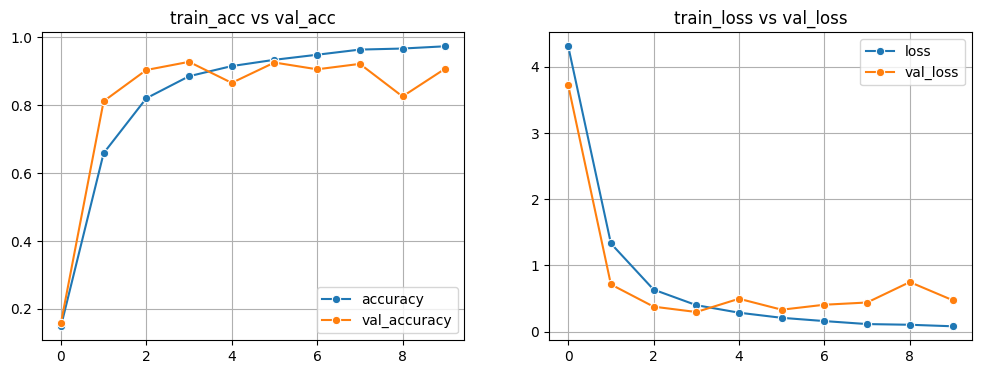

In [22]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
sns.lineplot(data=history.history['accuracy'], ax=axes[0], label='accuracy', marker='o')
sns.lineplot(data=history.history['val_accuracy'], ax=axes[0], label='val_accuracy', marker='o')

sns.lineplot(data=history.history['loss'], ax=axes[1], label='loss', marker='o')
sns.lineplot(data=history.history['val_loss'], ax=axes[1], label='val_loss', marker='o')

axes[0].set_title('train_acc vs val_acc')
axes[1].set_title('train_loss vs val_loss')

axes[0].grid(True)
axes[1].grid(True)

plt.legend()
plt.show()

In [23]:
from sklearn.metrics import confusion_matrix, classification_report, recall_score, precision_score, f1_score, accuracy_score

In [24]:
test_generator.reset()
pred_probabilities = model.predict(test_generator)

y_pred = np.argmax(pred_probabilities, axis=1)

y_test = test_generator.classes

16/16 ━━━━━━━━━━━━━━━━━━━━ 20s 724ms/step


In [25]:
recall_eff = recall_score(y_test, y_pred, average='macro')
precision_eff = precision_score(y_test, y_pred, average='macro')
f1_score_eff = f1_score(y_test, y_pred, average='macro')
acc_eff = accuracy_score(y_test, y_pred)

print(f"Precision (Macro Averaging): {precision_eff:.4f}")
print(f"Recall (Macro Averaging): {recall_eff:.4f}")
print(f"f1_score (Macro Averaging): {f1_score_eff:.4f}")
print(f"Accuracy : {acc_eff:.4f}")

Precision (Macro Averaging): 0.9502
Recall (Macro Averaging): 0.9380
f1_score (Macro Averaging): 0.9369
Accuracy : 0.9380


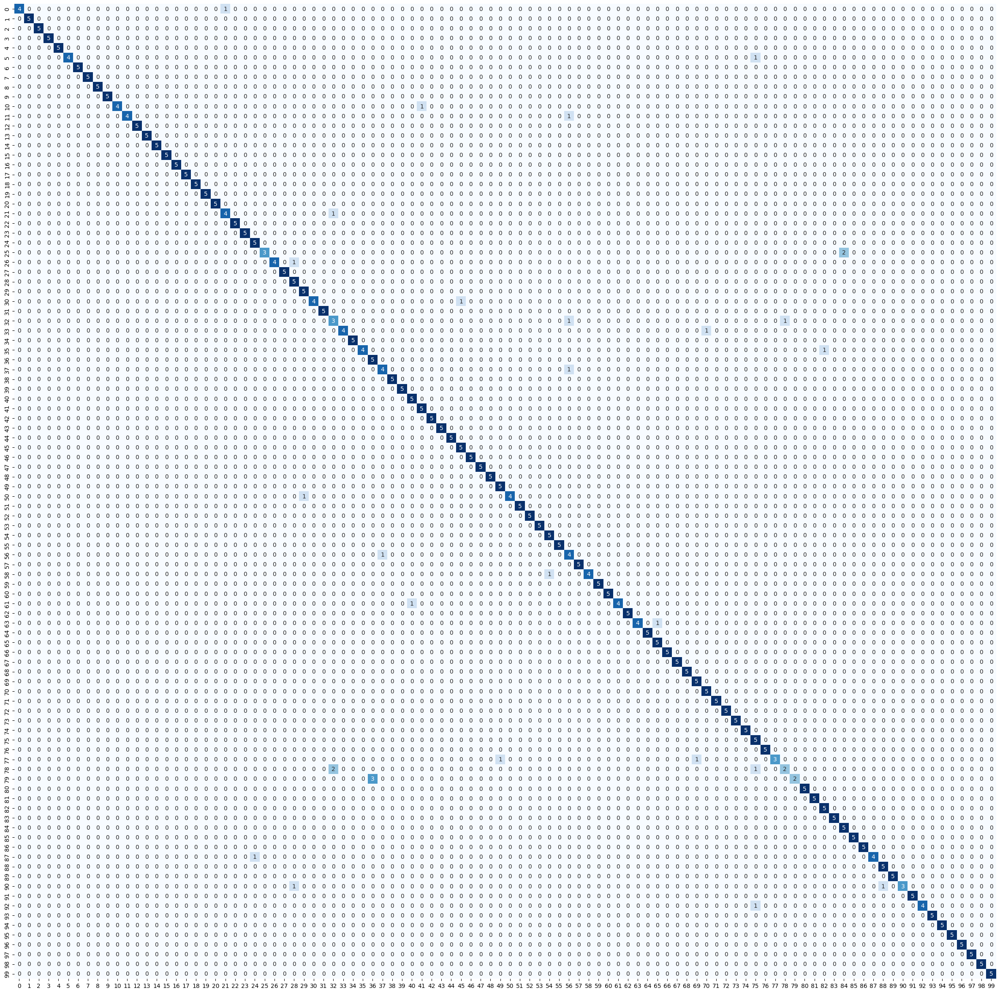

In [26]:
plt.figure(figsize=(30,30))
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, cbar=False, cmap='Blues')
plt.show()

In [27]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      0.80      0.89         5
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00         5
          10       1.00      0.80      0.89         5
          11       1.00      0.80      0.89         5
          12       1.00      1.00      1.00         5
          13       1.00      1.00      1.00         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.00         5
          17       1.00    

# ResNet50 (Evaluation)

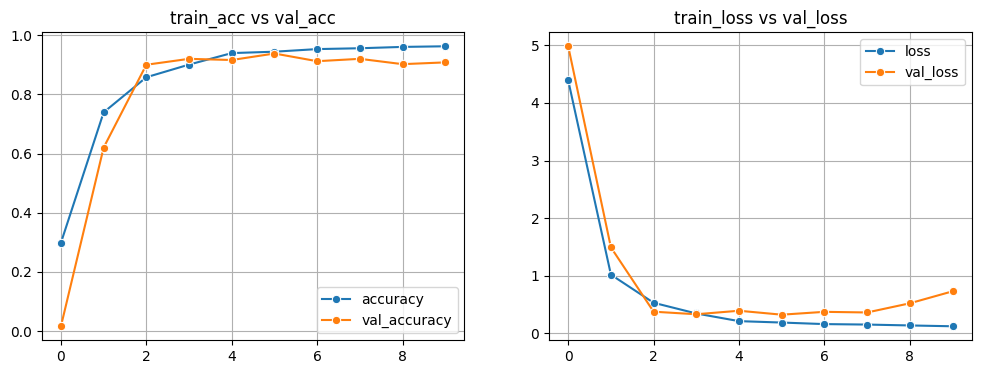

In [28]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
sns.lineplot(data=history2.history['accuracy'], ax=axes[0], label='accuracy', marker='o')
sns.lineplot(data=history2.history['val_accuracy'], ax=axes[0], label='val_accuracy', marker='o')

sns.lineplot(data=history2.history['loss'], ax=axes[1], label='loss', marker='o')
sns.lineplot(data=history2.history['val_loss'], ax=axes[1], label='val_loss', marker='o')

axes[0].set_title('train_acc vs val_acc')
axes[1].set_title('train_loss vs val_loss')

axes[0].grid(True)
axes[1].grid(True)

plt.legend()
plt.show()

In [29]:
test_generator.reset()
pred_probabilities2 = model2.predict(test_generator)

y_pred2 = np.argmax(pred_probabilities2, axis=1)

y_test = test_generator.classes

16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 318ms/step


In [30]:
recall_res = recall_score(y_test, y_pred2, average='macro')
precision_res = precision_score(y_test, y_pred2, average='macro')
f1_score_res = f1_score(y_test, y_pred2, average='macro')
acc_res = accuracy_score(y_test, y_pred2)



print(f"Precision (Macro Averaging): {precision_res:.4f}")
print(f"Recall (Macro Averaging): {recall_res:.4f}")
print(f"f1_score (Macro Averaging): {f1_score_res:.4f}")
print(f"Accuracy score : {acc_res:.4f}")

Precision (Macro Averaging): 0.9429
Recall (Macro Averaging): 0.9260
f1_score (Macro Averaging): 0.9240
Accuracy score : 0.9260


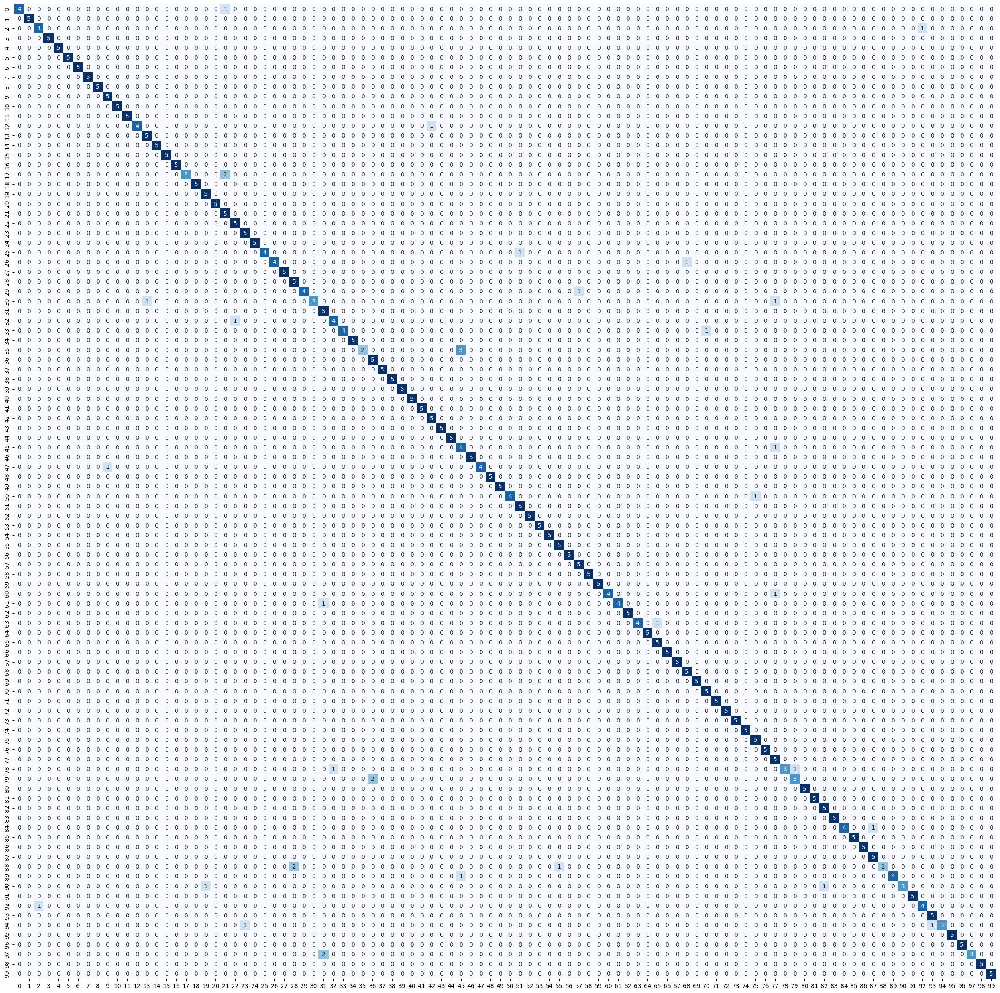

In [31]:
plt.figure(figsize=(30,30))
sns.heatmap(confusion_matrix(y_test,y_pred2), annot=True, cbar=False, cmap='Blues')
plt.show()

In [32]:
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      1.00      1.00         5
           2       0.80      0.80      0.80         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       0.83      1.00      0.91         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         5
          12       1.00      0.80      0.89         5
          13       0.83      1.00      0.91         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.00         5
          17       1.00    

In [33]:
dict_class = test_generator.class_indices
class_names = list(dict_class.keys())  # storing class/breed names in a list

# EfficientNetB3 (Inference)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


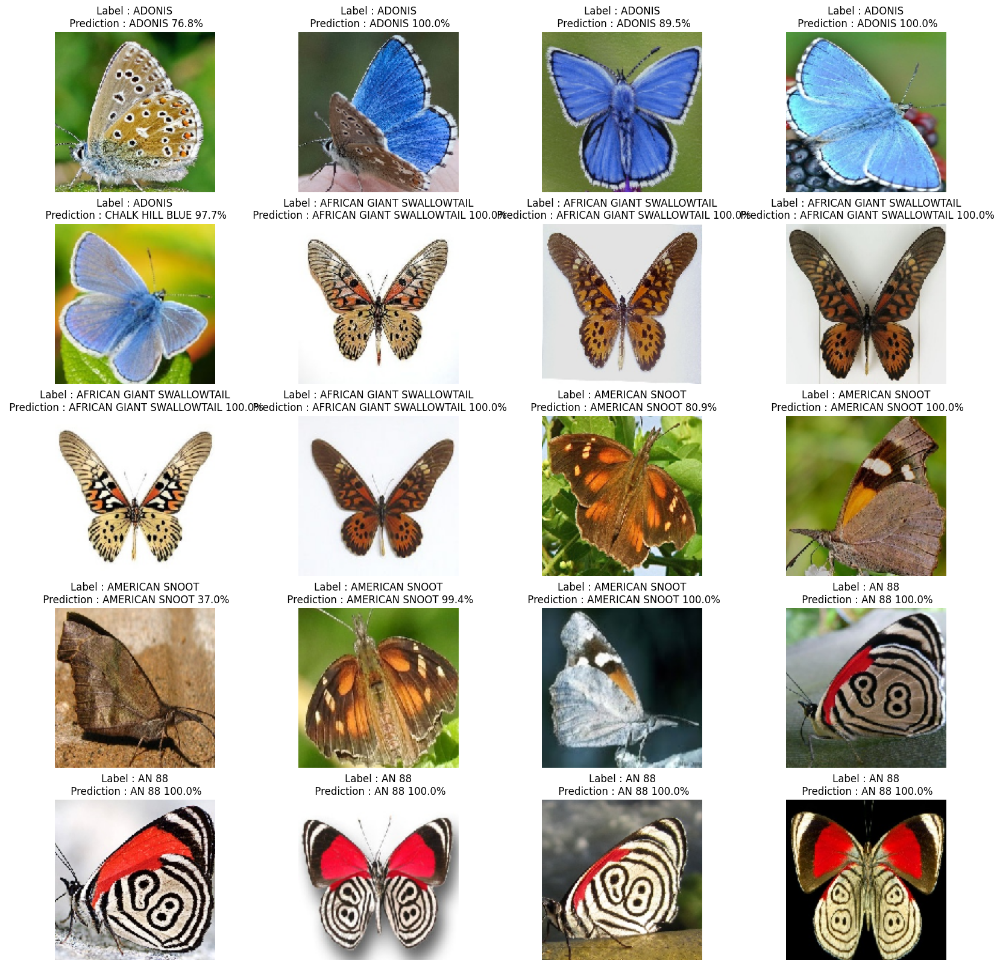

In [34]:
test_generator.reset()
img, label = next(test_generator)

prediction = model.predict(img)
test_pred_classes = np.argmax(prediction, axis=1)

plt.figure(figsize=(20,20))

for i in range(20):
    plt.subplot(5,4,i+1)
    plt.imshow(img[i])
    plt.axis('off')
    plt.title("Label : {}\n Prediction : {} {:.1f}%".format(class_names[np.argmax(label[i])], class_names[test_pred_classes[i]], 100 * np.max(prediction[i])))
plt.show()

# ResNet50 (Inference)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


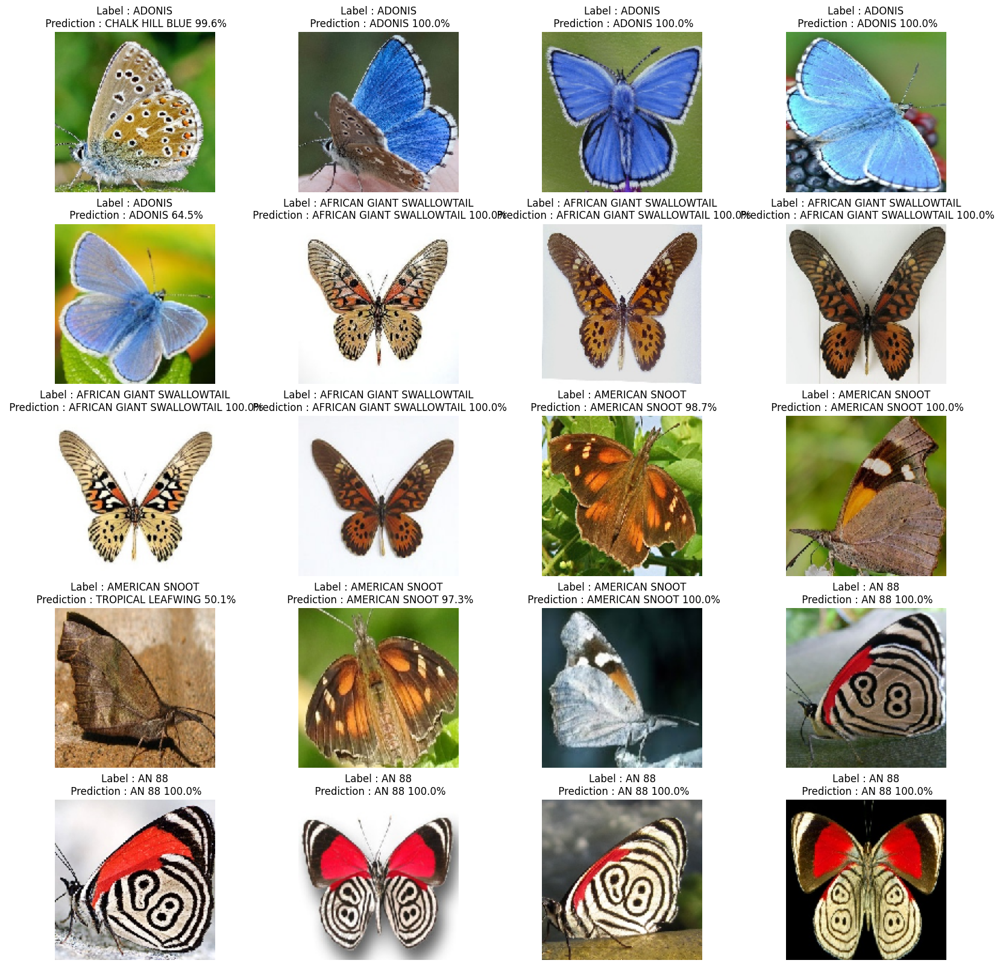

In [35]:
test_generator.reset()
img2, label2 = next(test_generator)

prediction2 = model2.predict(img2)
test_pred_classes2 = np.argmax(prediction2, axis=1)

plt.figure(figsize=(20,20))

for i in range(20):
    plt.subplot(5,4,i+1)
    plt.imshow(img2[i])
    plt.axis('off')
    plt.title("Label : {}\n Prediction : {} {:.1f}%".format(class_names[np.argmax(label2[i])], class_names[test_pred_classes2[i]], 100 * np.max(prediction2[i])))
plt.show()

# Save Models

In [36]:
model.save('efficientnetb3.h5')

In [37]:
model2.save('resnet50.h5')

In [38]:
import pickle 

In [39]:
with open('class_names.pkl', 'wb') as f:
    pickle.dump(class_names, f)

In [40]:
with open('trainHistoryDict', 'wb') as f:
    pickle.dump(history.history, f)

In [41]:
with open('trainHistoryDictResnet', 'wb') as f:
    pickle.dump(history2.history, f)